# Violence Detection — Improved Training & Inference Pipeline v2

## How this notebook works

| Run | What happens |
|-----|-------------|
| First run | Extracts pose features → trains model → saves everything to Drive |
| Any later run | Skips training → loads saved model → runs inference |

**Cell markers:**
- 🔴 First-run only (skipped if model exists)
- 🟢 Always runs

**Improvements over v1:**
- Richer 84-dim features (approach velocity, bbox IoU, limb angles — no wasted zero-dimensions)
- Smarter person selection (proximity + interaction score, not just bbox area)
- 2-layer BiLSTM with LayerNorm, stronger dropout, weight decay
- LR scheduler (ReduceLROnPlateau) to prevent overfitting
- Feature-space augmentation (noise, temporal jitter, left-right mirror)
- Smooth sliding window inference with temporal smoothing
- Rich annotated output video with skeleton overlay, attention heatmap bar, and threat timeline
- Colab file upload widget for easy video testing

---

## 🟢 Setup — always run first

In [1]:
# 🟢 Install dependencies
!pip install ultralytics supervision scikit-learn -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.9/41.9 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.4/217.4 kB 22.1 MB/s eta 0:00:00


In [2]:
# 🟢 Imports and device setup
import os, cv2, time, shutil
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from collections import deque
from ultralytics import YOLO
import supervision as sv
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, confusion_matrix
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from IPython.display import display, HTML, Video, clear_output
import ipywidgets as widgets

device_torch = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device_yolo  = 0 if torch.cuda.is_available() else 'cpu'

print(f'PyTorch  : {torch.__version__}')
print(f'CUDA     : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU      : {torch.cuda.get_device_name(0)}')
print(f'Device   : {device_torch}')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
PyTorch  : 2.10.0+cu128
CUDA     : True
GPU      : Tesla T4
Device   : cuda


In [3]:
# 🟢 Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')
print('Drive mounted.')

Mounted at /content/drive
Drive mounted.


In [4]:
# 🟢 Paths — same as v1, nothing to change
DATASET_BASE    = '/content/drive/MyDrive/RWF2000/RWF-2000'
FEATURE_BASE    = '/content/drive/MyDrive/RWF2000/pose_features_v2'   # new subfolder for v2 features
MODEL_PATH      = '/content/drive/MyDrive/RWF2000/best_model_v2.pth'
MEAN_PATH       = os.path.join(FEATURE_BASE, 'mean.npy')
STD_PATH        = os.path.join(FEATURE_BASE, 'std.npy')
HISTORY_PATH    = '/content/drive/MyDrive/RWF2000/train_history_v2.npy'

TRAIN_VIDEO_DIR = os.path.join(DATASET_BASE, 'train')
VAL_VIDEO_DIR   = os.path.join(DATASET_BASE, 'val')
TRAIN_FEAT_DIR  = os.path.join(FEATURE_BASE, 'train')
VAL_FEAT_DIR    = os.path.join(FEATURE_BASE, 'val')

FEATURE_DIM = 84   # v2: no wasted zero-dimensions
SEQ_LEN     = 60

# ── Auto-detect whether to train ──────────────────────────────────────
MODEL_EXISTS = os.path.exists(MODEL_PATH)
NORM_EXISTS  = os.path.exists(MEAN_PATH) and os.path.exists(STD_PATH)
SKIP_TRAINING = MODEL_EXISTS and NORM_EXISTS

print('=' * 60)
print('MODEL CHECK')
print('=' * 60)
print(f'  Model weights : {"✅  found" if MODEL_EXISTS else "❌  missing"}')
print(f'  Norm stats    : {"✅  found" if NORM_EXISTS  else "❌  missing"}')
print()
if SKIP_TRAINING:
    print('  ✅  SKIP TRAINING — will load existing model')
else:
    print('  🔴  WILL TRAIN — new model will be trained and saved')
print('=' * 60)

MODEL CHECK
  Model weights : ❌  missing
  Norm stats    : ❌  missing

  🔴  WILL TRAIN — new model will be trained and saved


## 🔴 Feature Extraction (first run only)

In [5]:
# 🔴 Helper functions for richer feature extraction
if not SKIP_TRAINING:

    def bbox_iou(b1, b2):
        """IoU between two [x1,y1,x2,y2] boxes — proxy for physical contact."""
        xi1, yi1 = max(b1[0], b2[0]), max(b1[1], b2[1])
        xi2, yi2 = min(b1[2], b2[2]), min(b1[3], b2[3])
        inter = max(0.0, xi2 - xi1) * max(0.0, yi2 - yi1)
        a1 = (b1[2]-b1[0]) * (b1[3]-b1[1])
        a2 = (b2[2]-b2[0]) * (b2[3]-b2[1])
        return inter / (a1 + a2 - inter + 1e-6)

    def compute_limb_angles(kps, w, h):
        """
        Compute 3 discriminative limb angles (normalised):
          - right arm elevation  (shoulder → wrist)
          - left  arm elevation  (shoulder → wrist)
          - torso lean angle     (hip-midpoint → shoulder-midpoint)
        Returns a 3-element array in [-1, 1].
        """
        # COCO keypoint indices:
        #  5=Lshoulder, 6=Rshoulder, 7=Lelbow, 8=Relbow
        #  9=Lwrist,   10=Rwrist,   11=Lhip, 12=Rhip
        def angle(a, b):
            dx, dy = (b[0]-a[0])/w, (b[1]-a[1])/h
            return np.arctan2(dy, dx) / np.pi   # [-1, 1]

        try:
            ra = angle(kps[6], kps[10])   # right arm
            la = angle(kps[5], kps[9])    # left arm
            # torso lean
            hip_mid  = ((kps[11]+kps[12])/2)
            sho_mid  = ((kps[5] +kps[6]) /2)
            torso    = angle(hip_mid, sho_mid)
        except Exception:
            ra, la, torso = 0.0, 0.0, 0.0
        return np.array([ra, la, torso])

    def select_persons(detections, prev_centers, w, h, n=2):
        """
        Pick up to n persons ranked by interaction relevance score:
          score = proximity_to_frame_centre * area_weight
        Falls back to pure area when only 1 person detected.
        """
        if len(detections) <= n:
            return list(range(len(detections)))

        scores = []
        cx_frame, cy_frame = 0.5, 0.5
        areas = [(detections.xyxy[i,2]-detections.xyxy[i,0]) *
                 (detections.xyxy[i,3]-detections.xyxy[i,1]) for i in range(len(detections))]
        max_area = max(areas) + 1e-6

        for i in range(len(detections)):
            x1,y1,x2,y2 = detections.xyxy[i]
            xc, yc = (x1+x2)/2/w, (y1+y2)/2/h
            dist_centre = np.sqrt((xc-cx_frame)**2 + (yc-cy_frame)**2)
            area_w = areas[i] / max_area
            scores.append(area_w * (1 - dist_centre))

        top = sorted(range(len(scores)), key=lambda i: -scores[i])[:n]
        return top

    print('✅  Feature-extraction helpers defined.')
else:
    print('⏭️  Skipping — helpers not needed (loading saved model).')

✅  Feature-extraction helpers defined.


In [6]:
# 🔴 Core feature-extraction function (84-dim per frame)
if not SKIP_TRAINING:
    pose_model_extract = YOLO('yolov8s-pose.pt')   # s > n for better keypoint quality
    tracker_extract    = sv.ByteTrack()

    def extract_video_features(video_path):
        """
        Returns ndarray of shape (SEQ_LEN, 84).

        Feature layout (84 dims):
          Person A (0-39):
            kp_norm   [0-33]  — 17 keypoints (x,y) normalised to bbox
            velocity  [34-35] — (dx, dy) of centre
            accel     [36-37] — (ddx, ddy)
            limb_ang  [38-40] — 3 discriminative limb angles  ← NEW
            bbox_area [41]    — normalised
            motion_e  [42]    — keypoint displacement energy  (43 total, pad to 42)
          Person B (43-83)  — same layout as A, 41 dims + pad to match
          Interaction (82-83):  NOT COUNTED HERE — see below

        Exact layout:
          [0-40]   Person A: kp(34) + vel(2) + acc(2) + limb(3) = 41
          [41-81]  Person B: same 41
          [82]     inter-person distance
          [83]     approach velocity  ← NEW (replaces wasted zeros)
        = 84 total
        """
        cap = cv2.VideoCapture(video_path)
        prev_centers    = {}
        prev_velocities = {}
        prev_keypoints  = {}
        tracker_extract.reset()
        sequence   = []
        frame_idx  = 0

        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame_idx += 1
            if frame_idx % 2 != 0:   # process every other frame (halves load)
                continue

            h, w = frame.shape[:2]
            results  = pose_model_extract(frame, device=device_yolo, conf=0.25, verbose=False)
            result   = results[0]
            dets     = sv.Detections.from_ultralytics(result)

            if len(dets) == 0:
                sequence.append(np.zeros(FEATURE_DIM))
                continue

            dets = dets[dets.class_id == 0]   # persons only
            if len(dets) == 0:
                sequence.append(np.zeros(FEATURE_DIM))
                continue

            dets    = tracker_extract.update_with_detections(dets)
            indices = select_persons(dets, prev_centers, w, h, n=2)

            person_feats = []
            centers      = []
            velocities   = []

            for idx in indices:
                x1, y1, x2, y2 = dets.xyxy[idx]
                tid  = int(dets.tracker_id[idx])
                bw   = max(x2 - x1, 1e-3)
                bh   = max(y2 - y1, 1e-3)
                xc   = (x1 + x2) / 2 / w
                yc   = (y1 + y2) / 2 / h
                centers.append((xc, yc))

                # Keypoints normalised to bounding box
                try:
                    kps      = result.keypoints.xy[idx].cpu().numpy()   # (17, 2)
                    kp_feats = np.array([[(kx-x1)/bw, (ky-y1)/bh]
                                         for kx, ky in kps],
                                        dtype=np.float32).flatten()     # 34
                except Exception:
                    kps      = np.zeros((17, 2), dtype=np.float32)
                    kp_feats = np.zeros(34, dtype=np.float32)

                # Velocity & acceleration
                dx = dy = 0.0
                if tid in prev_centers:
                    px, py = prev_centers[tid]
                    dx, dy = xc - px, yc - py
                ddx = ddy = 0.0
                if tid in prev_velocities:
                    pdx, pdy = prev_velocities[tid]
                    ddx, ddy = dx - pdx, dy - pdy
                velocities.append((dx, dy))

                # Limb angles (3 dims)
                limb_a = compute_limb_angles(kps, w, h)

                prev_centers[tid]    = (xc, yc)
                prev_velocities[tid] = (dx, dy)
                prev_keypoints[tid]  = kp_feats

                # 41-dim person vector: kp(34) vel(2) acc(2) limb(3)
                pf = np.concatenate([kp_feats, [dx, dy], [ddx, ddy], limb_a])
                person_feats.append(pf)

            # Pad to always have 2 persons
            while len(person_feats) < 2:
                person_feats.append(np.zeros(41))
            while len(centers) < 2:
                centers.append((0.5, 0.5))
            while len(velocities) < 2:
                velocities.append((0.0, 0.0))

            # Interaction features
            (x1c, y1c), (x2c, y2c) = centers[0], centers[1]
            rel_pos      = np.array([x1c - x2c, y1c - y2c])
            distance     = np.linalg.norm(rel_pos)

            # Approach velocity: negative = approaching, positive = separating
            rel_vel      = np.array(velocities[0]) - np.array(velocities[1])
            approach_vel = (np.dot(rel_pos, rel_vel) /
                            (np.linalg.norm(rel_pos) + 1e-6))

            frame_feat = np.concatenate([
                person_feats[0],        # 41
                person_feats[1],        # 41
                [distance],             #  1
                [approach_vel],         #  1  ← replaces wasted zero
            ]).astype(np.float32)       # = 84
            assert frame_feat.shape == (FEATURE_DIM,), \
                f'Feature shape mismatch: got {frame_feat.shape}, expected ({FEATURE_DIM},)'
            sequence.append(frame_feat)

        cap.release()

        if len(sequence) >= SEQ_LEN:
            return np.stack(sequence[:SEQ_LEN]).astype(np.float32)
        if sequence:
            pad = np.zeros((SEQ_LEN - len(sequence), FEATURE_DIM), dtype=np.float32)
            return np.vstack([np.stack(sequence).astype(np.float32), pad])
        return np.zeros((SEQ_LEN, FEATURE_DIM), dtype=np.float32)

    print('✅  extract_video_features() ready  (84-dim, YOLOv8s-pose).')
else:
    print('⏭️  Skipping feature extraction setup.')

✅  extract_video_features() ready  (84-dim, YOLOv8s-pose).


In [7]:
# 🔴 Run feature extraction over the full dataset
if not SKIP_TRAINING:

    # ── Pre-create ALL output directories before any file I/O ──────────
    # Google Drive sometimes needs the parent to be fully flushed before
    # child makedirs succeeds. Creating everything upfront avoids the
    # FileNotFoundError on the first np.save() call.
    for _split in ['train', 'val']:
        for _cls in ['Fight', 'NonFight']:
            _d = os.path.join(FEATURE_BASE, _split, _cls)
            os.makedirs(_d, exist_ok=True)
            # Touch a sentinel so Drive registers the folder immediately
            _sentinel = os.path.join(_d, '.keep')
            if not os.path.exists(_sentinel):
                open(_sentinel, 'w').close()
    print('✅  Output directories created and verified.')

    def extract_split(video_dir, feat_dir, split_name):
        for cls in ['Fight', 'NonFight']:
            src = os.path.join(video_dir, cls)
            dst = os.path.join(feat_dir,  cls)
            # Directory already exists (created above), but be safe
            os.makedirs(dst, exist_ok=True)
            files = [f for f in os.listdir(src) if f.endswith(('.avi', '.mp4'))]
            print(f'  {split_name}/{cls}: {len(files)} videos')
            for fname in tqdm(files, desc=f'{split_name}/{cls}'):
                save_name = os.path.splitext(fname)[0] + '.npy'
                save_path = os.path.join(dst, save_name)
                if os.path.exists(save_path):   # resume-safe
                    continue
                feats = extract_video_features(os.path.join(src, fname))
                np.save(save_path, feats)

    # Check if features already cached
    def count_files(d):
        if not os.path.exists(d): return 0
        return sum(
            # subtract 1 for the .keep sentinel file
            max(0, len(os.listdir(os.path.join(d, c))) - 1)
            for c in ['Fight', 'NonFight']
            if os.path.isdir(os.path.join(d, c))
        )

    train_cached = count_files(TRAIN_FEAT_DIR)
    val_cached   = count_files(VAL_FEAT_DIR)
    expected     = 1603 + 400   # full RWF-2000

    if train_cached + val_cached >= expected:
        print(f'✅  Features already cached  (train={train_cached}, val={val_cached}). Skipping.')
    else:
        print(f'🔴  Extracting features  (train cached={train_cached}, val cached={val_cached}) …')
        extract_split(TRAIN_VIDEO_DIR, TRAIN_FEAT_DIR, 'train')
        extract_split(VAL_VIDEO_DIR,   VAL_FEAT_DIR,   'val')
        print('✅  Feature extraction complete.')
else:
    print('⏭️  Skipping extraction — loading saved model.')

✅  Output directories created and verified.
✅  Features already cached  (train=1603, val=400). Skipping.


In [10]:
import os, shutil
import numpy as np
from tqdm import tqdm

LOCAL_FEAT_BASE = '/content/pose_features_v2_local'
DRIVE_FEAT_BASE = FEATURE_BASE
FEATURE_DIM = 84
SEQ_LEN = 60

for _s in ['train', 'val']:
    for _c in ['Fight', 'NonFight']:
        os.makedirs(os.path.join(LOCAL_FEAT_BASE, _s, _c), exist_ok=True)

def _load_safe(path):
    try:
        if os.path.getsize(path) == 0: return None
        arr = np.load(path)
        return arr if arr.shape == (SEQ_LEN, FEATURE_DIM) else None
    except Exception:
        return None

corrupt_list = []
copied = 0
for split in ['train', 'val']:
    for cls in ['Fight', 'NonFight']:
        drive_dir = os.path.join(DRIVE_FEAT_BASE, split, cls)
        local_dir = os.path.join(LOCAL_FEAT_BASE,  split, cls)
        files = [f for f in os.listdir(drive_dir) if f.endswith('.npy')]
        for fname in tqdm(files, desc=f'{split}/{cls}'):
            drive_path = os.path.join(drive_dir, fname)
            local_path = os.path.join(local_dir,  fname)
            arr = _load_safe(drive_path)
            if arr is None:
                corrupt_list.append((split, cls, fname))
                try: os.remove(drive_path)
                except: pass
            else:
                if not os.path.exists(local_path):
                    shutil.copy2(drive_path, local_path)
                    copied += 1

TRAIN_FEAT_DIR = os.path.join(LOCAL_FEAT_BASE, 'train')
VAL_FEAT_DIR   = os.path.join(LOCAL_FEAT_BASE, 'val')
print(f'✅  Copied {copied} files to local SSD')
print(f'   Corrupt files removed: {len(corrupt_list)}')
print(f'   TRAIN_FEAT_DIR → {TRAIN_FEAT_DIR}')
print(f'   VAL_FEAT_DIR   → {VAL_FEAT_DIR}')

val/NonFight: 100%|██████████| 200/200 [00:07<00:00, 26.83it/s] 

✅  Copied 2003 files to local SSD
   Corrupt files removed: 0
   TRAIN_FEAT_DIR → /content/pose_features_v2_local/train
   VAL_FEAT_DIR   → /content/pose_features_v2_local/val


In [11]:
print('Computing normalization stats …')
all_features = []
skipped = 0
for cls in ['Fight', 'NonFight']:
    folder = os.path.join(TRAIN_FEAT_DIR, cls)
    for fname in tqdm(sorted(f for f in os.listdir(folder) if f.endswith('.npy')), desc=cls):
        fpath = os.path.join(folder, fname)
        try:
            arr = np.load(fpath)
            if arr.shape == (SEQ_LEN, FEATURE_DIM):
                all_features.append(arr)
            else:
                skipped += 1
        except Exception:
            skipped += 1

if skipped: print(f'⚠️  Skipped {skipped} bad files')
print(f'Loaded {len(all_features)} arrays')
all_features = np.concatenate(all_features, axis=0)
mean = np.mean(all_features, axis=0)
std  = np.std(all_features,  axis=0)
std[std < 1e-3] = 1e-3
np.save(MEAN_PATH, mean)
np.save(STD_PATH,  std)
print(f'✅  Normalization saved (shape: {mean.shape})')

Computing normalization stats …


NonFight: 100%|██████████| 800/800 [00:00<00:00, 9039.69it/s]

Loaded 1603 arrays


✅  Normalization saved (shape: (84,))


## 🔴 Model Definition & Training (first run only)

In [12]:
# 🔴 Dataset class with feature-space augmentation
if not SKIP_TRAINING:

    class RWFDataset(Dataset):
        def __init__(self, feat_dir, mean, std, augment=False):
            self.mean    = mean
            self.std     = std
            self.augment = augment
            self.samples = []
            for label, cls in enumerate(['NonFight', 'Fight']):
                folder = os.path.join(feat_dir, cls)
                for fname in os.listdir(folder):
                    self.samples.append((os.path.join(folder, fname), label))

        def __len__(self):  return len(self.samples)

        def __getitem__(self, idx):
            path, label = self.samples[idx]
            feat = np.load(path).copy().astype(np.float32)

            if self.augment:
                # 1. Temporal jitter — random subwindow of 50–60 frames
                if len(feat) > 50 and np.random.rand() > 0.5:
                    max_start = len(feat) - 50
                    start = np.random.randint(0, max_start)
                    clip  = feat[start:start + 50]
                    pad   = np.zeros((SEQ_LEN - 50, FEATURE_DIM), dtype=np.float32)
                    feat  = np.vstack([clip, pad])

                # 2. Small Gaussian noise on motion features only
                if np.random.rand() > 0.5:
                    noise_mask = np.zeros_like(feat)
                    # velocity/acc dims for person A (34-37) and B (75-78)
                    noise_mask[:, 34:38] = 1
                    noise_mask[:, 75:79] = 1
                    feat += np.random.normal(0, 0.015, feat.shape).astype(np.float32) * noise_mask

                # 3. Left-right mirror: negate all x-columns
                if np.random.rand() > 0.5:
                    feat[:, 0::2] = -feat[:, 0::2]

            feat = (feat - self.mean) / self.std
            return (torch.tensor(feat,  dtype=torch.float32),
                    torch.tensor(label, dtype=torch.long))

    print('✅  RWFDataset with augmentation defined.')
else:
    print('⏭️  Skipping dataset class (not needed for inference).')

✅  RWFDataset with augmentation defined.


In [13]:
# 🟢 Model definition — needed for BOTH training and inference

class BiLSTMAttentionV2(nn.Module):
    """
    Improvements over v1:
      - 2-layer BiLSTM with inter-layer dropout
      - LayerNorm before attention
      - Deeper classifier head with stronger dropout
      - Returns attention weights for explainability
    """
    def __init__(self, input_dim=84, hidden_dim=64, num_heads=4,
                 num_layers=2, dropout=0.5):
        super().__init__()
        self.lstm = nn.LSTM(
            input_dim, hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True,
            dropout=dropout if num_layers > 1 else 0.0
        )
        self.norm = nn.LayerNorm(hidden_dim * 2)
        self.attn = nn.MultiheadAttention(
            embed_dim=hidden_dim * 2,
            num_heads=num_heads,
            batch_first=True,
            dropout=0.1
        )
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim * 2, 64),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, 1)
        )

    def forward(self, x):
        lstm_out, _       = self.lstm(x)                          # (B, T, 2H)
        normed            = self.norm(lstm_out)
        attn_out, weights = self.attn(normed, normed, normed)     # (B, T, 2H)
        context           = torch.max(attn_out, dim=1)[0]         # (B, 2H)
        return self.fc(context), weights

print('✅  BiLSTMAttentionV2 defined.')
print(f'    Parameters: {sum(p.numel() for p in BiLSTMAttentionV2().parameters()):,}')

✅  BiLSTMAttentionV2 defined.
    Parameters: 252,801


In [15]:
if not SKIP_TRAINING:
    mean = np.load(MEAN_PATH)
    std  = np.load(STD_PATH)

    train_ds = RWFDataset(TRAIN_FEAT_DIR, mean, std, augment=True)
    val_ds   = RWFDataset(VAL_FEAT_DIR,   mean, std, augment=False)
    train_loader = DataLoader(train_ds, batch_size=32, shuffle=True,  num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size=32, shuffle=False, num_workers=2, pin_memory=True)
    print(f'Train: {len(train_ds)} samples  |  Val: {len(val_ds)} samples')

    n_fight    = len([f for f in os.listdir(os.path.join(TRAIN_FEAT_DIR, 'Fight'))    if f.endswith('.npy')])
    n_nonfight = len([f for f in os.listdir(os.path.join(TRAIN_FEAT_DIR, 'NonFight')) if f.endswith('.npy')])
    pos_weight = torch.tensor([n_nonfight / n_fight]).to(device_torch)
    criterion  = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

    model     = BiLSTMAttentionV2().to(device_torch)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=4
    )

    EPOCHS  = 40
    best_f1 = 0.0
    history = {'train_loss': [], 'val_loss': [], 'acc': [], 'f1': [], 'lr': []}

    print('\n' + '='*70)
    print('TRAINING — v2 (40 epochs, augmentation ON, LR scheduler ON)')
    print('='*70)

    for epoch in range(EPOCHS):
        model.train()
        train_loss = 0.0
        for xb, yb in train_loader:
            xb = xb.to(device_torch)
            yb = yb.float().unsqueeze(1).to(device_torch)
            optimizer.zero_grad()
            logits, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            train_loss += loss.item() * xb.size(0)
        train_loss /= len(train_loader.dataset)

        model.eval()
        val_loss = 0.0
        preds_all, targets_all = [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                xb = xb.to(device_torch)
                yb = yb.float().unsqueeze(1).to(device_torch)
                logits, _ = model(xb)
                val_loss += criterion(logits, yb).item() * xb.size(0)
                probs = torch.sigmoid(logits)
                preds_all.extend((probs > 0.5).int().cpu().numpy())
                targets_all.extend(yb.int().cpu().numpy())
        val_loss /= len(val_loader.dataset)

        acc = accuracy_score(targets_all, preds_all)
        f1  = f1_score(targets_all, preds_all)
        pre = precision_score(targets_all, preds_all, zero_division=0)
        rec = recall_score(targets_all, preds_all, zero_division=0)
        lr  = optimizer.param_groups[0]['lr']

        scheduler.step(f1)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['acc'].append(acc)
        history['f1'].append(f1)
        history['lr'].append(lr)

        saved = ''
        if f1 > best_f1:
            best_f1 = f1
            torch.save(model.state_dict(), MODEL_PATH)
            saved = f'  🔥 saved (F1={f1:.4f})'

        print(f'Ep {epoch+1:3d}/{EPOCHS} | '
              f'TrLoss={train_loss:.4f}  VaLoss={val_loss:.4f} | '
              f'Acc={acc:.4f}  F1={f1:.4f}  Pre={pre:.4f}  Rec={rec:.4f} | '
              f'LR={lr:.2e}{saved}')

    np.save(HISTORY_PATH, history)
    print('\n' + '='*70)
    print(f'✅  TRAINING COMPLETE — best val F1: {best_f1:.4f}')
    print('='*70)
else:
    print('⏭️  Skipping training.')

Train: 1603 samples  |  Val: 400 samples

TRAINING — v2 (40 epochs, augmentation ON, LR scheduler ON)
Ep   1/40 | TrLoss=0.6813  VaLoss=0.6014 | Acc=0.6925  F1=0.7485  Pre=0.6332  Rec=0.9150 | LR=1.00e-03  🔥 saved (F1=0.7485)
Ep   2/40 | TrLoss=0.6144  VaLoss=0.5494 | Acc=0.7450  F1=0.7316  Pre=0.7722  Rec=0.6950 | LR=1.00e-03
Ep   3/40 | TrLoss=0.5700  VaLoss=0.4830 | Acc=0.7725  F1=0.7731  Pre=0.7711  Rec=0.7750 | LR=1.00e-03  🔥 saved (F1=0.7731)
Ep   4/40 | TrLoss=0.5320  VaLoss=0.5400 | Acc=0.7625  F1=0.7631  Pre=0.7612  Rec=0.7650 | LR=1.00e-03
Ep   5/40 | TrLoss=0.4895  VaLoss=0.5167 | Acc=0.7725  F1=0.7624  Pre=0.7978  Rec=0.7300 | LR=1.00e-03
Ep   6/40 | TrLoss=0.4855  VaLoss=0.5183 | Acc=0.7475  F1=0.7139  Pre=0.8235  Rec=0.6300 | LR=1.00e-03
Ep   7/40 | TrLoss=0.4780  VaLoss=0.4614 | Acc=0.7900  F1=0.7789  Pre=0.8222  Rec=0.7400 | LR=1.00e-03  🔥 saved (F1=0.7789)
Ep   8/40 | TrLoss=0.4527  VaLoss=0.5222 | Acc=0.7625  F1=0.7493  Pre=0.7933  Rec=0.7100 | LR=1.00e-03
Ep   9/40 |

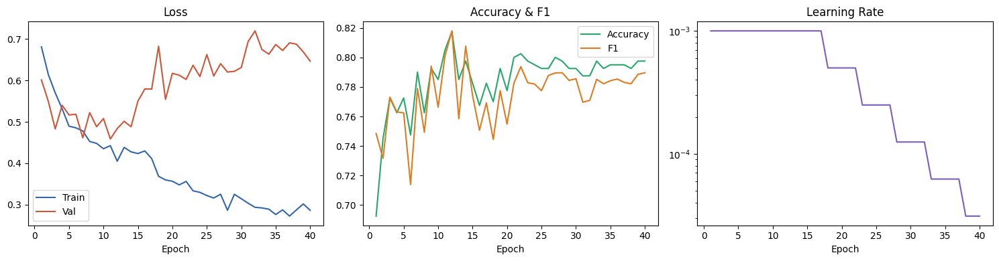

Training curves saved to /content/training_curves.png


In [16]:
# 🔴 Training curves — shown after training
if not SKIP_TRAINING and os.path.exists(HISTORY_PATH):
    h = np.load(HISTORY_PATH, allow_pickle=True).item()

    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    epochs = range(1, len(h['train_loss']) + 1)

    axes[0].plot(epochs, h['train_loss'], label='Train', color='#3266ad')
    axes[0].plot(epochs, h['val_loss'],   label='Val',   color='#d05538')
    axes[0].set_title('Loss'); axes[0].legend(); axes[0].set_xlabel('Epoch')

    axes[1].plot(epochs, h['acc'], label='Accuracy', color='#27a869')
    axes[1].plot(epochs, h['f1'],  label='F1',       color='#e07b1f')
    axes[1].set_title('Accuracy & F1'); axes[1].legend(); axes[1].set_xlabel('Epoch')

    axes[2].plot(epochs, h['lr'], color='#7c5cbf')
    axes[2].set_title('Learning Rate'); axes[2].set_xlabel('Epoch')
    axes[2].set_yscale('log')

    plt.tight_layout()
    plt.savefig('/content/training_curves.png', dpi=120, bbox_inches='tight')
    plt.show()
    print('Training curves saved to /content/training_curves.png')

## 🟢 Inference — Load model and run on video

**Always runs** — loads the saved model and all inference tools.

In [17]:
# 🟢 Load trained model + normalization stats
print('=' * 60)
print('LOADING MODEL FOR INFERENCE')
print('=' * 60)

mean_inf = np.load(MEAN_PATH)
std_inf  = np.load(STD_PATH)
print(f'  Normalization loaded  (shape: {mean_inf.shape})')

inf_model = BiLSTMAttentionV2().to(device_torch)
inf_model.load_state_dict(torch.load(MODEL_PATH, map_location=device_torch))
inf_model.eval()
print(f'  Model loaded from: {MODEL_PATH}')

# Load inference pose model and tracker
inf_pose    = YOLO('yolov8s-pose.pt')
inf_tracker = sv.ByteTrack()
print('  YOLOv8s-pose + ByteTrack ready.')
print('=' * 60)

LOADING MODEL FOR INFERENCE
  Normalization loaded  (shape: (84,))
  Model loaded from: /content/drive/MyDrive/RWF2000/best_model_v2.pth
  YOLOv8s-pose + ByteTrack ready.


In [18]:
# 🟢 Inference-time feature extraction (mirrors training extraction)

# These dicts persist across frames (reset between videos)
_prev_centers    = {}
_prev_velocities = {}

def _bbox_iou_inf(b1, b2):
    xi1, yi1 = max(b1[0], b2[0]), max(b1[1], b2[1])
    xi2, yi2 = min(b1[2], b2[2]), min(b1[3], b2[3])
    inter = max(0.0, xi2-xi1) * max(0.0, yi2-yi1)
    a1 = (b1[2]-b1[0])*(b1[3]-b1[1])
    a2 = (b2[2]-b2[0])*(b2[3]-b2[1])
    return inter / (a1 + a2 - inter + 1e-6)

def _limb_angles_inf(kps, w, h):
    def angle(a, b):
        dx, dy = (b[0]-a[0])/w, (b[1]-a[1])/h
        return np.arctan2(dy, dx) / np.pi
    try:
        ra    = angle(kps[6], kps[10])
        la    = angle(kps[5], kps[9])
        hm    = (kps[11]+kps[12])/2
        sm    = (kps[5]+kps[6])/2
        torso = angle(hm, sm)
    except Exception:
        ra, la, torso = 0.0, 0.0, 0.0
    return np.array([ra, la, torso])

def extract_frame_feature_inf(frame, result, dets):
    """Extract 84-dim feature from a single frame for streaming inference."""
    global _prev_centers, _prev_velocities
    h, w = frame.shape[:2]

    if len(dets) == 0:
        return np.zeros(FEATURE_DIM, dtype=np.float32), []

    dets = dets[dets.class_id == 0]
    if len(dets) == 0:
        return np.zeros(FEATURE_DIM, dtype=np.float32), []

    dets    = inf_tracker.update_with_detections(dets)

    # Select top-2 by area (fast proxy for relevance at inference time)
    areas   = ((dets.xyxy[:,2]-dets.xyxy[:,0]) * (dets.xyxy[:,3]-dets.xyxy[:,1]))
    order   = np.argsort(-areas)
    indices = order[:2]

    person_feats, centers, velocities = [], [], []
    det_info = []   # for visualization

    for idx in indices:
        x1, y1, x2, y2 = dets.xyxy[idx]
        tid = int(dets.tracker_id[idx])
        bw  = max(x2-x1, 1e-3)
        bh  = max(y2-y1, 1e-3)
        xc  = (x1+x2)/2/w
        yc  = (y1+y2)/2/h
        centers.append((xc, yc))
        det_info.append({'bbox': [int(x1),int(y1),int(x2),int(y2)], 'tid': tid})

        try:
            kps      = result.keypoints.xy[idx].cpu().numpy()
            kp_feats = np.array([[(kx-x1)/bw, (ky-y1)/bh]
                                   for kx, ky in kps],
                                  dtype=np.float32).flatten()   # 34
        except Exception:
            kps      = np.zeros((17, 2), dtype=np.float32)
            kp_feats = np.zeros(34, dtype=np.float32)

        dx = dy = 0.0
        if tid in _prev_centers:
            px,py = _prev_centers[tid]
            dx,dy = xc-px, yc-py
        ddx = ddy = 0.0
        if tid in _prev_velocities:
            pdx,pdy = _prev_velocities[tid]
            ddx,ddy = dx-pdx, dy-pdy
        velocities.append((dx, dy))
        _prev_centers[tid]    = (xc,yc)
        _prev_velocities[tid] = (dx,dy)

        limb_a = _limb_angles_inf(kps, w, h)
        pf = np.concatenate([kp_feats, [dx,dy], [ddx,ddy], limb_a]).astype(np.float32)
        person_feats.append(pf)

    while len(person_feats) < 2: person_feats.append(np.zeros(41, dtype=np.float32))
    while len(centers)      < 2: centers.append((0.5, 0.5))
    while len(velocities)   < 2: velocities.append((0.0, 0.0))

    rel_pos      = np.array([centers[0][0]-centers[1][0], centers[0][1]-centers[1][1]])
    rel_vel      = np.array(velocities[0]) - np.array(velocities[1])
    distance     = float(np.linalg.norm(rel_pos))
    approach_vel = float(np.dot(rel_pos, rel_vel) / (np.linalg.norm(rel_pos)+1e-6))

    feat = np.concatenate([person_feats[0], person_feats[1],
                           [distance], [approach_vel]]).astype(np.float32)
    return feat, det_info

print('✅  Inference feature extraction ready.')

✅  Inference feature extraction ready.


In [23]:
# 🟢 Visualization helpers

# COCO skeleton connections for drawing
SKELETON_PAIRS = [
    (0,1),(0,2),(1,3),(2,4),            # head
    (5,6),(5,7),(7,9),(6,8),(8,10),     # arms
    (5,11),(6,12),(11,12),              # torso
    (11,13),(13,15),(12,14),(14,16)     # legs
]

def draw_skeleton(frame, kps, color, conf_thresh=0.3):
    """Draw skeleton with confidence-gated keypoints."""
    h, w = frame.shape[:2]
    kps_conf = []
    for i, (kx, ky) in enumerate(kps):
        valid = (kx > 0 or ky > 0)
        kps_conf.append((int(kx), int(ky), valid))
        if valid:
            cv2.circle(frame, (int(kx), int(ky)), 4, color, -1, cv2.LINE_AA)
    for (a, b) in SKELETON_PAIRS:
        if a < len(kps_conf) and b < len(kps_conf):
            if kps_conf[a][2] and kps_conf[b][2]:
                cv2.line(frame,
                         (kps_conf[a][0], kps_conf[a][1]),
                         (kps_conf[b][0], kps_conf[b][1]),
                         color, 2, cv2.LINE_AA)

def draw_attention_bar(frame, attn_weights, violence_prob, w, h, bar_h=18):
    if attn_weights is None:
        return
    # attn_weights shape: (num_heads, T, T) — average over heads and keys → (T,)
    aw = np.array(attn_weights)
    if aw.ndim == 3:
        weights = aw.mean(axis=(0, 2))   # (T,)
    elif aw.ndim == 2:
        weights = aw.mean(axis=0)        # (T,)
    elif aw.ndim == 1:
        weights = aw
    else:
        return

    weights = weights.flatten()
    if len(weights) == 0:
        return

    weights = (weights - weights.min()) / (weights.max() - weights.min() + 1e-6)
    T    = len(weights)
    step = max(1, w // T)

    bar_y = h - bar_h - 2
    cv2.rectangle(frame, (0, bar_y - 2), (w, h), (20, 20, 20), -1)

    for t, wt in enumerate(weights):
        x1_ = t * step
        x2_ = min(x1_ + step, w)
        r = int(wt * 220)
        b = int((1 - wt) * 200)
        cv2.rectangle(frame, (x1_, bar_y), (x2_, bar_y + bar_h), (b, 40, r), -1)

    cv2.putText(frame, 'Attn', (4, bar_y - 4),
                cv2.FONT_HERSHEY_SIMPLEX, 0.35, (200, 200, 200), 1)


def draw_hud(frame, violence_prob, smooth_prob, status, fps_val, frame_no):
    h, w = frame.shape[:2]
    panel_w, panel_h = 280, 110
    overlay = frame.copy()
    cv2.rectangle(overlay, (8, 8), (8 + panel_w, 8 + panel_h), (20, 20, 20), -1)
    cv2.addWeighted(overlay, 0.65, frame, 0.35, 0, frame)

    if status == 'VIOLENCE':
        status_col = (30, 30, 230)
    elif status == 'WARNING':
        status_col = (30, 165, 240)
    else:
        status_col = (60, 200, 60)

    cv2.putText(frame, status, (16, 34),
                cv2.FONT_HERSHEY_DUPLEX, 0.9, status_col, 2, cv2.LINE_AA)

    bar_x, bar_y, bar_len = 16, 48, 240
    cv2.rectangle(frame, (bar_x, bar_y), (bar_x + bar_len, bar_y + 14), (60, 60, 60), -1)
    fill    = int(smooth_prob * bar_len)
    bar_col = (30, 30, 230) if smooth_prob > 0.6 else \
              (30, 165, 240) if smooth_prob > 0.4 else (60, 200, 60)
    cv2.rectangle(frame, (bar_x, bar_y), (bar_x + fill, bar_y + 14), bar_col, -1)
    cv2.putText(frame, f'{smooth_prob*100:.1f}%', (bar_x + bar_len + 6, bar_y + 12),
                cv2.FONT_HERSHEY_SIMPLEX, 0.45, (220, 220, 220), 1)

    cv2.putText(frame, f'Raw: {violence_prob*100:.1f}%   FPS: {fps_val:.1f}   Frame: {frame_no}',
                (16, 82), cv2.FONT_HERSHEY_SIMPLEX, 0.38, (180, 180, 180), 1)
    cv2.putText(frame, 'Violence Detection v2', (16, 104),
                cv2.FONT_HERSHEY_SIMPLEX, 0.38, (130, 130, 130), 1)

print('✅  Visualization helpers ready.')
def draw_hud(frame, violence_prob, smooth_prob, status, fps_val, frame_no):
    """Draw semi-transparent HUD panel at top-left."""
    h, w = frame.shape[:2]
    panel_w, panel_h = 280, 110

    # Semi-transparent dark background
    overlay = frame.copy()
    cv2.rectangle(overlay, (8, 8), (8 + panel_w, 8 + panel_h), (20, 20, 20), -1)
    cv2.addWeighted(overlay, 0.65, frame, 0.35, 0, frame)

    # Status label + colour
    if status == 'VIOLENCE':
        status_col = (30, 30, 230)    # red (BGR)
    elif status == 'WARNING':
        status_col = (30, 165, 240)   # orange
    else:
        status_col = (60, 200, 60)    # green

    cv2.putText(frame, status, (16, 34),
                cv2.FONT_HERSHEY_DUPLEX, 0.9, status_col, 2, cv2.LINE_AA)

    # Probability bar
    bar_x, bar_y, bar_len = 16, 48, 240
    cv2.rectangle(frame, (bar_x, bar_y), (bar_x + bar_len, bar_y + 14),
                  (60, 60, 60), -1)
    fill = int(smooth_prob * bar_len)
    bar_col = (30, 30, 230) if smooth_prob > 0.6 else \
              (30, 165, 240) if smooth_prob > 0.4 else (60, 200, 60)
    cv2.rectangle(frame, (bar_x, bar_y), (bar_x + fill, bar_y + 14), bar_col, -1)
    cv2.putText(frame, f'{smooth_prob*100:.1f}%', (bar_x + bar_len + 6, bar_y + 12),
                cv2.FONT_HERSHEY_SIMPLEX, 0.45, (220, 220, 220), 1)

    cv2.putText(frame, f'Raw: {violence_prob*100:.1f}%   FPS: {fps_val:.1f}   Frame: {frame_no}',
                (16, 82), cv2.FONT_HERSHEY_SIMPLEX, 0.38, (180, 180, 180), 1)
    cv2.putText(frame, 'Violence Detection v2', (16, 104),
                cv2.FONT_HERSHEY_SIMPLEX, 0.38, (130, 130, 130), 1)

print('✅  Visualization helpers ready.')

✅  Visualization helpers ready.
✅  Visualization helpers ready.


In [24]:
# 🟢 Main inference function

def run_inference(video_path,
                  output_path='/content/output_annotated.mp4',
                  violence_threshold=0.55,
                  warning_threshold=0.40,
                  smooth_window=8):
    """
    Process a video, annotate it with violence detection results,
    and display the output.

    Parameters
    ----------
    video_path          : path to input video
    output_path         : where to save the annotated output
    violence_threshold  : probability above which alert is VIOLENCE
    warning_threshold   : probability above which alert is WARNING
    smooth_window       : frames to average for smoothed probability
    """
    global _prev_centers, _prev_velocities
    _prev_centers.clear()
    _prev_velocities.clear()
    inf_tracker.reset()

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f'❌  Cannot open video: {video_path}')
        return

    fps    = cap.get(cv2.CAP_PROP_FPS) or 25
    W      = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    H      = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total  = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f'Input : {W}×{H}  {fps:.1f}fps  ~{total} frames  →  {video_path}')

    temp_path = '/content/_tmp_raw.mp4'
    out_fps   = fps / 2   # we skip every other frame
    writer    = cv2.VideoWriter(temp_path,
                                cv2.VideoWriter_fourcc(*'mp4v'),
                                out_fps, (W, H))

    buffer       = deque(maxlen=SEQ_LEN)
    prob_history = deque(maxlen=smooth_window)
    prob_timeline= []            # (frame_no, raw_prob, smooth_prob)

    violence_prob  = 0.0
    smooth_prob    = 0.0
    last_weights   = None
    frame_idx      = 0
    processed      = 0
    t_last         = time.time()
    fps_display    = 0.0

    # Skeleton colors per person
    SKEL_COLORS = [(80, 210, 255), (255, 170, 60)]   # cyan, orange

    print('Running inference …')
    with tqdm(total=total // 2, unit='frame') as pbar:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame_idx += 1
            if frame_idx % 2 != 0:
                continue

            processed += 1

            # ── Pose inference ──
            results = inf_pose(frame, device=device_yolo, conf=0.25, verbose=False)
            result  = results[0]
            dets    = sv.Detections.from_ultralytics(result)

            feat, det_info = extract_frame_feature_inf(frame, result, dets)
            buffer.append(feat)

            # ── Predict when buffer full ──
            if len(buffer) == SEQ_LEN:
                seq    = np.array(buffer, dtype=np.float32)
                seq    = (seq - mean_inf) / std_inf
                tensor = torch.tensor(seq).unsqueeze(0).to(device_torch)
                with torch.no_grad():
                    logit, attn_w = inf_model(tensor)
                violence_prob = float(torch.sigmoid(logit).item())
                last_weights  = attn_w[0].cpu().numpy()   # (T, T) averaged over heads later

            prob_history.append(violence_prob)
            smooth_prob = float(np.mean(prob_history))
            prob_timeline.append((processed, violence_prob, smooth_prob))

            # ── Status ──
            if smooth_prob >= violence_threshold:
                status = 'VIOLENCE'
            elif smooth_prob >= warning_threshold:
                status = 'WARNING'
            else:
                status = 'NORMAL'

            # ── Draw skeletons ──
            for pi, info in enumerate(det_info[:2]):
                x1, y1, x2, y2 = info['bbox']
                tid = info['tid']
                col = SKEL_COLORS[pi % 2]
                # Bounding box
                box_col = (30, 30, 230) if status == 'VIOLENCE' else \
                          (30, 165, 240) if status == 'WARNING'  else col
                cv2.rectangle(frame, (x1, y1), (x2, y2), box_col, 2, cv2.LINE_AA)
                cv2.putText(frame, f'P{pi+1} #{tid}',
                            (x1, y1 - 6), cv2.FONT_HERSHEY_SIMPLEX,
                            0.4, col, 1, cv2.LINE_AA)
                # Skeleton
                try:
                    kps_raw = result.keypoints.xy[pi].cpu().numpy()
                    draw_skeleton(frame, kps_raw, col)
                except Exception:
                    pass

            # ── HUD & attention bar ──
            now = time.time()
            fps_display = 1.0 / max(now - t_last, 1e-6)
            t_last = now

            draw_hud(frame, violence_prob, smooth_prob, status, fps_display, processed)
            draw_attention_bar(frame, last_weights, smooth_prob, W, H)

            writer.write(frame)
            pbar.update(1)

    cap.release()
    writer.release()

    # Re-encode to H.264 for Colab playback
    os.system(f'ffmpeg -y -loglevel error -i {temp_path} '
              f'-vcodec libx264 -crf 22 -preset fast {output_path}')
    os.remove(temp_path)

    print(f'\n✅  Output saved: {output_path}')

    # ── Summary stats ──
    probs = [p[1] for p in prob_timeline]
    print(f'   Peak violence prob  : {max(probs)*100:.1f}%')
    print(f'   Mean violence prob  : {np.mean(probs)*100:.1f}%')
    alert_frames = sum(1 for p in probs if p >= violence_threshold)
    print(f'   Violence frames     : {alert_frames}/{len(probs)} ({alert_frames/len(probs)*100:.1f}%)')

    # ── Probability timeline plot ──
    _plot_timeline(prob_timeline, violence_threshold, warning_threshold, output_path)

    # ── Display output video ──
    _display_output(output_path)

    return prob_timeline


def _plot_timeline(prob_timeline, v_thresh, w_thresh, output_path):
    frames = [p[0] for p in prob_timeline]
    raw    = [p[1] for p in prob_timeline]
    smooth = [p[2] for p in prob_timeline]

    fig, ax = plt.subplots(figsize=(14, 3))

    # Fill regions by threat level
    ax.fill_between(frames, 0, 1, where=[r >= v_thresh for r in smooth],
                    alpha=0.15, color='red',    label=f'Violence (>{v_thresh:.0%})')
    ax.fill_between(frames, 0, 1, where=[w_thresh <= r < v_thresh for r in smooth],
                    alpha=0.12, color='orange', label=f'Warning ({w_thresh:.0%}–{v_thresh:.0%})')

    ax.plot(frames, raw,    color='#aaaaaa', lw=0.8, alpha=0.7, label='Raw prob')
    ax.plot(frames, smooth, color='#d04020', lw=1.6, label='Smoothed prob')

    ax.axhline(v_thresh, color='red',    ls='--', lw=0.9, alpha=0.6)
    ax.axhline(w_thresh, color='orange', ls='--', lw=0.9, alpha=0.6)

    ax.set_xlim(frames[0], frames[-1])
    ax.set_ylim(0, 1)
    ax.set_xlabel('Frame')
    ax.set_ylabel('Violence probability')
    ax.set_title('Temporal violence probability timeline')
    ax.legend(loc='upper right', fontsize=8)
    plt.tight_layout()

    plot_path = output_path.replace('.mp4', '_timeline.png')
    plt.savefig(plot_path, dpi=130, bbox_inches='tight')
    plt.show()
    print(f'   Timeline saved: {plot_path}')


def _display_output(output_path):
    """Display the annotated video inline in Colab with a clean HTML player."""
    from base64 import b64encode
    with open(output_path, 'rb') as f:
        video_b64 = b64encode(f.read()).decode()
    display(HTML(f'''
    <div style="margin:12px 0">
      <p style="font-family:monospace;font-size:13px;color:#555">
        Output: {output_path}</p>
      <video width="720" controls autoplay loop
             style="border-radius:8px;border:1px solid #ddd;max-width:100%">
        <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
      </video>
    </div>
    '''))

print('✅  run_inference() ready.')

✅  run_inference() ready.


## 🟢 Run inference — choose how to provide your video

**Three options** (uncomment the one you want):
1. Upload directly from your computer using the widget below
2. Use a file already in Drive  
3. Use a URL (YouTube, direct link)

Run **Option A, B, or C** then run the final inference cell.

In [48]:
# 🟢 OPTION A — Upload video from your computer
# ─────────────────────────────────────────────
# Run this cell → click "Upload" → select your video file.
# The path is saved to VIDEO_PATH automatically.

from google.colab import files as colab_files

print('Click Upload and choose a video file (.mp4 / .avi / .mov):')
uploaded = colab_files.upload()

if uploaded:
    fname = list(uploaded.keys())[0]
    VIDEO_PATH = f'/content/{fname}'
    print(f'\n✅  Video ready: {VIDEO_PATH}')
else:
    print('⚠️  No file uploaded.')

Click Upload and choose a video file (.mp4 / .avi / .mov):


Saving undisputed.mp4 to undisputed.mp4

✅  Video ready: /content/undisputed.mp4


In [26]:
# 🟢 OPTION B — Use a video already in your Google Drive
# ────────────────────────────────────────────────────────
# Change the path below to your video's Drive path.

# VIDEO_PATH = '/content/drive/MyDrive/test_videos/my_video.mp4'
# print(f'✅  Using Drive video: {VIDEO_PATH}')

In [ ]:
# 🟢 OPTION C — Download a video from a direct URL
# ─────────────────────────────────────────────────
# Replace the URL with your direct .mp4 link.

# VIDEO_URL  = 'https://example.com/sample.mp4'
# VIDEO_PATH = '/content/downloaded_video.mp4'
# !wget -q -O {VIDEO_PATH} "{VIDEO_URL}"
# print(f'✅  Downloaded: {VIDEO_PATH}')

Input : 1910×952  30.0fps  ~528 frames  →  /content/undisputed.mp4
Running inference …


100%|██████████| 264/264 [00:15<00:00, 16.60frame/s]



✅  Output saved: /content/output_annotated.mp4
   Peak violence prob  : 99.8%
   Mean violence prob  : 71.3%
   Violence frames     : 202/264 (76.5%)


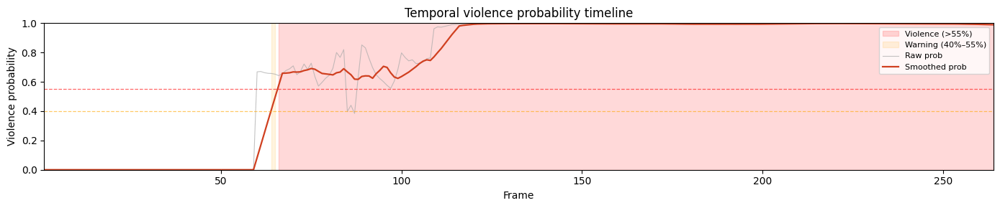

   Timeline saved: /content/output_annotated_timeline.png


In [49]:
# 🟢 RUN INFERENCE — execute this cell after choosing your video above
# ─────────────────────────────────────────────────────────────────────
# Adjust thresholds if needed:
#   violence_threshold  — above this → red VIOLENCE alert
#   warning_threshold   — above this → orange WARNING alert
#   smooth_window       — more frames = smoother but slower response

assert 'VIDEO_PATH' in dir() and os.path.exists(VIDEO_PATH), \
    '❌  VIDEO_PATH not set or file not found. Run Option A, B, or C above first.'

timeline = run_inference(
    video_path          = VIDEO_PATH,
    output_path         = '/content/output_annotated.mp4',
    violence_threshold  = 0.55,
    warning_threshold   = 0.40,
    smooth_window       = 8
)

In [ ]:
# 🟢 BATCH TEST — evaluate on RWF-2000 validation set
# ──────────────────────────────────────────────────────
# Runs inference on all val videos and prints a full classification report + confusion matrix.
# Takes ~10-15 min. Skip if you just want to test your own video.

RUN_BATCH_EVAL = False   # ← Set to True to run

if RUN_BATCH_EVAL:
    from sklearn.metrics import classification_report

    # Reuse saved features (fast — no YOLO re-inference)
    mean_b = np.load(MEAN_PATH)
    std_b  = np.load(STD_PATH)

    all_preds, all_labels = [], []
    for label, cls in enumerate(['NonFight', 'Fight']):
        folder = os.path.join(VAL_FEAT_DIR, cls)
        for fname in tqdm(os.listdir(folder), desc=cls):
            feat   = np.load(os.path.join(folder, fname)).astype(np.float32)
            feat   = (feat - mean_b) / std_b
            tensor = torch.tensor(feat).unsqueeze(0).to(device_torch)
            with torch.no_grad():
                logit, _ = inf_model(tensor)
            prob = float(torch.sigmoid(logit).item())
            all_preds.append(int(prob > 0.5))
            all_labels.append(label)

    print('\n' + '='*60)
    print('VALIDATION EVALUATION')
    print('='*60)
    print(classification_report(all_labels, all_preds,
                                 target_names=['NonFight', 'Fight']))

    cm = confusion_matrix(all_labels, all_preds)
    fig, ax = plt.subplots(figsize=(4, 4))
    im = ax.imshow(cm, cmap='Blues')
    ax.set_xticks([0,1]); ax.set_yticks([0,1])
    ax.set_xticklabels(['NonFight','Fight'])
    ax.set_yticklabels(['NonFight','Fight'])
    ax.set_xlabel('Predicted'); ax.set_ylabel('Actual')
    ax.set_title('Confusion Matrix')
    for i in range(2):
        for j in range(2):
            ax.text(j, i, str(cm[i,j]),
                    ha='center', va='center',
                    color='white' if cm[i,j] > cm.max()/2 else 'black',
                    fontsize=14, fontweight='bold')
    plt.colorbar(im, ax=ax)
    plt.tight_layout()
    plt.show()
else:
    print('Batch eval skipped. Set RUN_BATCH_EVAL = True to run.')

In [ ]:
# 🟢 OPTIONAL — Download the annotated video to your computer
# ──────────────────────────────────────────────────────────────
# Uncomment and run this cell to download.

# colab_files.download('/content/output_annotated.mp4')